# Final Project: Machine Learning
## Evi Prousanidou, Christian Archibald

In [ ]:
import numpy as np
import pandas as pd
import os
from openai import OpenAI
import sys
from IPython.display import HTML

sys.path.append('../..')
os.environ['OPENAI_API_KEY'] = None #Add key here

import os
path = os.getcwd()

In [2]:
client = OpenAI()

# completion = client.chat.completions.create(
#     model="gpt-4o",
#     messages=[
#         {
#             "role": "user",
#             "content": "Write a one-sentence bedtime story about a unicorn."
#         }
#     ]
# )

# print(completion.choices[0].message.content)

In [3]:
# Progress bar
def progress(value, max=100):
    return HTML("""
        <progress
            value='{value}'
            max='{max}',
            style='width: 100%'
        >
            {value}
        </progress>
    """.format(value=value, max=max))

# read the repo in PATH and append the texts in a list
def get_data(PATH):
    list_dir = os.listdir(PATH)
    texts = []
    fund_names = []
    out = display(progress(0, len(list_dir)-1), display_id=True)
    for ii, filename in enumerate(list_dir) :
        with open(PATH+'/'+filename, 'r', encoding="utf8") as f :
            txt = f.read()
            try :
                txt_split = txt.split('<head_breaker>')
                summary = txt_split[1].strip()
                fund_name = txt_split[0].strip()
            except :
                summary = txt
                fund_name = ''
        texts.append(summary)
        fund_names.append(fund_name)
        out.update(progress(ii, len(list_dir)-1))
    return fund_names, texts

In [4]:
# Get the summary path
SUMMARY_PATH = path + '/NLP_app/MutualFundSummary'
fund_names , summaries = get_data(SUMMARY_PATH)

In [5]:
## load titles and summaries to chatgpt
#print((fund_names))
print(summaries)


['Investment Objective\nThrivent Partner Healthcare Portfolio (the "Portfolio") seeks long-term capital growth.\nFees and Expenses\nThis table describes the fees and expenses that you may pay if you buy and hold shares of the Portfolio. If you own a variable annuity contract or variable life insurance contract, you will have additional expenses including mortality and expense risk charges. Please refer to the prospectus for your variable contract for additional information about charges for those contracts.\nSHAREHOLDER FEES\n(fees paid directly from your investment)\nMaximum Sales Charge (load) Imposed On Purchases (as a percentage of offering price)\tN/A\nMaximum Deferred Sales Charge (load) (as a percentage of the net asset value at time of purchase or redemption, whichever is lower)\tN/A\nANNUAL PORTFOLIO OPERATING EXPENSES\n(expenses that you pay each year as a percentage of\nthe value of your investment)\nManagement Fees\t0.83%\nOther Expenses\t0.10%\nTotal Annual Portfolio Opera

In [6]:
print(len(fund_names))

545


In [7]:
import numpy as np
print(np.__version__)


1.26.4


In [8]:

SUMMARY_LABELS_PATH = path+'/NLP_app/MutualFundLabels.csv'

df_extraction = pd.DataFrame({'fund_name' : fund_names})
df_label = pd.read_csv(SUMMARY_LABELS_PATH)
df = df_label.merge(df_extraction, on='fund_name', how='inner')
df['Predicted Strategy'] = np.nan
df['Strategy evidence'] = np.nan
df = df.rename(columns={'Leverage?': 'Derivatives_label', "Ivestment Strategy": "Investment Strategy"})

In [9]:
df = df[df["Investment Strategy"].isin(["Balanced Fund (Low Risk)", "Fixed Income Long Only (Low Risk)", "Equity Long Only (Low Risk)"])]

In [10]:
## Ask whether the fund use derivatives
import nltk

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')
nltk.download('words')



[nltk_data] Downloading package punkt to /Users/Christian/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/Christian/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/Christian/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/Christian/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/Christian/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /Users/Christian/nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to /Users/Christian/nltk_data...
[nltk_data]   Pa

True

In [11]:
from langchain.document_loaders import DirectoryLoader

# Load documents from a directory
loader = DirectoryLoader(path=path+"/NLP_app/MutualFundSummary", glob="*.txt")

# Load the text data from the directory
documents = loader.load()

In [12]:
print(len(documents))

545


In [13]:
print(documents[0])

page_content='Thrivent Partner Healthcare Portfolio

<head_breaker>

Investment Objective Thrivent Partner Healthcare Portfolio (the "Portfolio") seeks long-term capital growth. Fees and Expenses This table describes the fees and expenses that you may pay if you buy and hold shares of the Portfolio. If you own a variable annuity contract or variable life insurance contract, you will have additional expenses including mortality and expense risk charges. Please refer to the prospectus for your variable contract for additional information about charges for those contracts. SHAREHOLDER FEES (fees paid directly from your investment) Maximum Sales Charge (load) Imposed On Purchases (as a percentage of offering price)	N/A Maximum Deferred Sales Charge (load) (as a percentage of the net asset value at time of purchase or redemption, whichever is lower)	N/A ANNUAL PORTFOLIO OPERATING EXPENSES (expenses that you pay each year as a percentage of the value of your investment) Management Fees	0.83%

In [14]:
from langchain.text_splitter import RecursiveCharacterTextSplitter, CharacterTextSplitter
from langchain_chroma import Chroma
from langchain.vectorstores import Chroma
from langchain.embeddings.openai import OpenAIEmbeddings
embedding = OpenAIEmbeddings()
persist_directory = './docs/chroma'

#llm_name = "gpt-3.5-turbo"
llm_name = "gpt-4o-mini"
print(llm_name)

from langchain.chat_models import ChatOpenAI
llm = ChatOpenAI(model_name=llm_name, temperature=0)
from langchain.chains import RetrievalQA

gpt-4o-mini


/var/folders/49/1jq9sd950fg6397s7sm972380000gn/T/ipykernel_61867/775079074.py:5: LangChainDeprecationWarning: The class `OpenAIEmbeddings` was deprecated in LangChain 0.0.9 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-openai package and should be used instead. To use it run `pip install -U :class:`~langchain-openai` and import as `from :class:`~langchain_openai import OpenAIEmbeddings``.
  embedding = OpenAIEmbeddings()
/var/folders/49/1jq9sd950fg6397s7sm972380000gn/T/ipykernel_61867/775079074.py:13: LangChainDeprecationWarning: The class `ChatOpenAI` was deprecated in LangChain 0.0.10 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-openai package and should be used instead. To use it run `pip install -U :class:`~langchain-openai` and import as `from :class:`~langchain_openai import ChatOpenAI``.
  llm = ChatOpenAI(model_name=llm_name, temperature=0)


In [15]:
r_splitter = RecursiveCharacterTextSplitter(
    chunk_size=1000,
    chunk_overlap=100,
    separators=["\n\n", "\n", "(?<=\. )", " "]
)

<>:4: SyntaxWarning: invalid escape sequence '\.'
<>:4: SyntaxWarning: invalid escape sequence '\.'
/var/folders/49/1jq9sd950fg6397s7sm972380000gn/T/ipykernel_61867/1737249519.py:4: SyntaxWarning: invalid escape sequence '\.'
  separators=["\n\n", "\n", "(?<=\. )", " "]


In [16]:
splits=r_splitter.split_documents(documents)

vectordb = Chroma.from_documents(
  documents=splits,
  embedding=embedding,
  persist_directory=persist_directory
)

vectordb.persist()

print(len(vectordb))

104055


/var/folders/49/1jq9sd950fg6397s7sm972380000gn/T/ipykernel_61867/3036125008.py:9: LangChainDeprecationWarning: Since Chroma 0.4.x the manual persistence method is no longer supported as docs are automatically persisted.
  vectordb.persist()


In [17]:
from langchain.prompts import PromptTemplate

In [18]:
# Build prompt
template = """Use the following pieces of context to answer the question at the end.

Choose only one of the following categories:
- Balanced Fund
- Fixed Income Long Only
- Equity Long Only

Respond in the following format:
Category: <one of the above>
Confidence: <1 to 10>

{context}
Question: {question}
Helpful Answer:"""
QA_CHAIN_PROMPT = PromptTemplate.from_template(template)

In [19]:
qa_chain = RetrievalQA.from_chain_type(
  llm,
  retriever=vectordb.as_retriever(),
  return_source_documents=True,
  chain_type_kwargs={"prompt": QA_CHAIN_PROMPT}
)

In [20]:
question = f"How would you classify this fund's investment strategy?"


result = qa_chain({"query": question})

/var/folders/49/1jq9sd950fg6397s7sm972380000gn/T/ipykernel_61867/3371990706.py:4: LangChainDeprecationWarning: The method `Chain.__call__` was deprecated in langchain 0.1.0 and will be removed in 1.0. Use :meth:`~invoke` instead.
  result = qa_chain({"query": question})


In [21]:
result

{'query': "How would you classify this fund's investment strategy?",
 'result': 'Category: Balanced Fund  \nConfidence: 8',
 'source_documents': [Document(metadata={'source': '/Users/Christian/Desktop/MSMFT/Semester 2/Machine Learning/MF815-Mutual-Fund-Style-Classification/NLP_app/MutualFundSummary/American Funds College 2018 Fund.txt'}, page_content='Principal investment strategies The fund will attempt to achieve its investment objectives by investing in a mix of American Funds in different combinations and weightings. The underlying American Funds represent a variety of fund categories such as growth-and-income funds, equity-income funds, balanced funds and bond funds. The fund categories represent differing investment objectives. For example, growth-and-income funds seek long-term growth-and-income primarily through investments in stocks. Equity-income and balanced funds generally strive for income and growth through stocks and/or bond investments, while bond funds seek current inc

In [22]:
# df['predicted_derivatives_2'] = np.nan
# df['derivative_evidence_2'] = np.nan

In [23]:
for ii in range(len(df)):
  fund_name = df.iloc[ii]['fund_name']

  question = f"How would you classify {fund_name}'s investment strategy?"
  print(ii)

  result = qa_chain({"query": question})

  # print(result["result"])

  df.iloc[ii, 7] = result["result"]

  df.iloc[ii, 8] = result["source_documents"][0].page_content


0


/var/folders/49/1jq9sd950fg6397s7sm972380000gn/T/ipykernel_61867/3129692381.py:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Category: Balanced Fund  
Confidence: 9' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.iloc[ii, 7] = result["result"]
/var/folders/49/1jq9sd950fg6397s7sm972380000gn/T/ipykernel_61867/3129692381.py:13: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'American Funds College 2018 Fund <head_breaker>

American Funds College 2018 Fund

Investment objectives The fund will seek to achieve the following objectives to varying degrees: growth, income and preservation of capital, depending on the proximity to its target date. The target date is meant to roughly correspond to the year in which the fund beneficiary will start to withdraw funds to meet higher educat

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [24]:
def get_prediction(value):
    if value.startswith('Category: Balanced Fund'):
        return "Balanced Fund (Low Risk)"
    elif value.startswith('Category: Fixed Income Long Only'):
        return "Fixed Income Long Only (Low Risk)"
    elif value.startswith('Category: Equity Long Only'):
        return "Equity Long Only (Low Risk)"
    else:
        return np.nan
    return value

In [25]:
df['Prediction'] = df['Predicted Strategy'].apply(get_prediction)
# df['Derivatives_label'] = df['Derivatives_label'].apply(replace_with_value)

In [26]:
pd.set_option('display.max_colwidth', None)

In [27]:
df.iloc[4]['Strategy evidence']

'American Funds College 2030 Fund <head_breaker>\n\nAmerican Funds College 2030 Fund\n\nInvestment objectives The fund will seek to achieve the following objectives to varying degrees: growth, income and preservation of capital, depending on the proximity to its target date. The target date is meant to roughly correspond to the year in which the fund beneficiary will start to withdraw funds to meet higher education expenses. The fund will increasingly emphasize income and preservation of capital by investing a greater portion of its assets in bond, equity-income and balanced funds as it approaches and passes its target date. In this way, the fund seeks to achieve an appropriate balance of total return and stability during different time periods.'

Saving Results to a csv for faster retrieval

In [29]:
df.set_index('id', inplace=True)

In [30]:
df.to_csv(path +"/NLP_app/MutualFundLabelsPlusPredictions.csv", index = True)

In [31]:
df = pd.read_csv(path +"/NLP_app/MutualFundLabelsPlusPredictions.csv", index_col=0)

In [32]:
from sklearn.metrics import confusion_matrix

In [34]:
df2 = df.dropna(subset = ['Investment Strategy', 'Prediction'])

In [35]:
df2

,fund_name,Performance fee?,Investment Strategy,Derivatives_label,Portfolio composition,Concentration,Predicted Strategy,Strategy evidence,Prediction
id,,,,,,,,,
0000051931-18-000151,American Funds College 2018 Fund,NaN,Balanced Fund (Low Risk),Yes,Investment grade securities,Diversified,Category: Balanced Fund \nConfidence: 9,"American Funds College 2018 Fund <head_breaker>\n\nAmerican Funds College 2018 Fund\n\nInvestment objectives The fund will seek to achieve the following objectives to varying degrees: growth, income and preservation of capital, depending on the proximity to its target date. The target date is meant to roughly correspond to the year in which the fund beneficiary will start to withdraw funds to meet higher education expenses. The fund will increasingly emphasize income and preservation of capital by investing a greater portion of its assets in bond, equity-income and balanced funds as it approaches and passes its target date. In this way, the fund seeks to achieve an appropriate balance of total return and stability during different time periods.",Balanced Fund (Low Risk)
0000051931-18-000151,American Funds College 2021 Fund,NaN,Balanced Fund (Low Risk),Yes,Investment grade securities,Diversified,Category: Balanced Fund \nConfidence: 9,"American Funds College 2021 Fund <head_breaker>\n\nAmerican Funds College 2021 Fund\n\nInvestment objectives The fund will seek to achieve the following objectives to varying degrees: growth, income and preservation of capital, depending on the proximity to its target date. The target date is meant to roughly correspond to the year in which the fund beneficiary will start to withdraw funds to meet higher education expenses. The fund will increasingly emphasize income and preservation of capital by investing a greater portion of its assets in bond, equity-income and balanced funds as it approaches and passes its target date. In this way, the fund seeks to achieve an appropriate balance of total return and stability during different time periods.",Balanced Fund (Low Risk)
0000051931-18-000151,American Funds College 2024 Fund,NaN,Balanced Fund (Low Risk),Yes,Investment grade securities,Diversified,Category: Balanced Fund \nConfidence: 9,"American Funds College 2024 Fund <head_breaker>\n\nAmerican Funds College 2024 Fund\n\nInvestment objectives The fund will seek to achieve the following objectives to varying degrees: growth, income and preservation of capital, depending on the proximity to its target date. The target date is meant to roughly correspond to the year in which the fund beneficiary will start to withdraw funds to meet higher education expenses. The fund will increasingly emphasize income and preservation of capital by investing a greater portion of its assets in bond, equity-income and balanced funds as it approaches and passes its target date. In this way, the fund seeks to achieve an appropriate balance of total return and stability during different time periods.",Balanced Fund (Low Risk)
0000051931-18-000151,American Funds College 2027 Fund,NaN,Balanced Fund (Low Risk),Yes,Investment grade securities,Diversified,Category: Balanced Fund \nConfidence: 9,"American Funds College 2027 Fund <head_breaker>\n\nAmerican Funds College 2027 Fund\n\nInvestment objectives The fund will seek to achieve the following objectives to varying degrees: growth, income and preservation of capital, depending on the proximity to its target date. The target date is meant to roughly correspond to the year in which the fund beneficiary will start to withdraw funds to meet higher education expenses. The fund will increasingly emphasize income and preservation of capital by investing a greater portion of its assets in bond, equity-income and balanced funds as it approaches and passes its target date. In this way, the fund seeks to achieve an appropriate balance of total return and stability during different time periods.",Balanced Fund (Low Risk)
0000051931-18-000151,American Funds Colleg

In [36]:
num_unknown = df['Prediction'].isna().sum()
print("\nNumber unknown:")
print(num_unknown)


Number unknown:
0


In [37]:
df2["Investment Strategy"].unique()

array(['Balanced Fund (Low Risk)', 'Fixed Income Long Only (Low Risk)',
       'Equity Long Only (Low Risk)'], dtype=object)

In [38]:
cm = confusion_matrix(df2['Investment Strategy'], df2['Prediction'])
print(cm)

[[ 79   3   2]
 [ 76 167   4]
 [  9  10 111]]


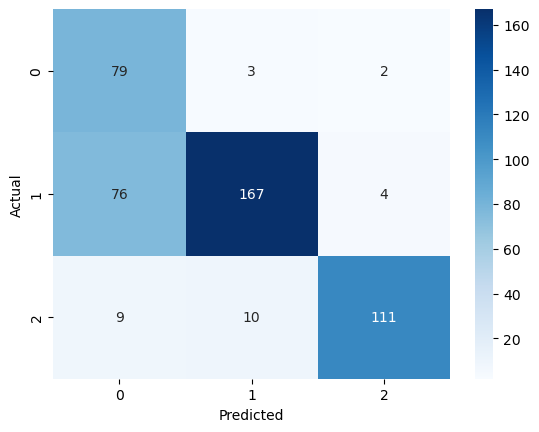

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()
